In [2]:

import numpy as np
import scvelo as scv
import pandas as pd
import loompy
import glob

In [4]:
import scanpy as sc

## Merger the loom files

In [81]:
loom_files = glob.glob('/d0-bayes/home/meisl/neuroblastoma/ThMYCN_210610/Files/*_tumor/outs/velocyto/*.loom')

In [82]:
loompy.combine(loom_files, output_file='/home/hsarkar/Projects/ThMYCN/tumor_merged.loom')

## Read merged loom file and additional dataframes

In [115]:
gene_anot = pd.read_csv('/home/hsarkar/Projects/ThMYCN/Gene_set_annotations.csv',index_col=0)

In [8]:
adata = scv.read('/home/hsarkar/Projects/ThMYCN/tumor_merged.loom')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


## Running scvelo 

In [9]:
import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.4 (python 3.8.10) on 2021-11-24 09:51.


In [10]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization


In [13]:
annot = pd.read_csv('/home/hsarkar/Projects/ThMYCN/annotation_5_samples.csv',header=None, skiprows=1, index_col=0, names=['clusters'])

In [15]:
annot.head()

,clusters
het1_tumor_TCTACCGTCTCTTCAA-1,T/NK cells
het2_tumor_AAACCCAAGACCATAA-1,T/NK cells
het1_tumor_TCCGATCCAGCGATTT-1,B cells
het2_tumor_AAACCCAAGGTTATAG-1,B cells
het1_tumor_CACGGGTGTGCTTATG-1,Neutrophils


In [36]:
adata.obs.head()

""
CellID
het1_tumor:AAAGGTAGTACCGCGTx
het1_tumor:AAAGGGCTCAGTGTCAx
het1_tumor:AAACCCATCTATACTCx
het1_tumor:AAAGAACCAACTTGGTx
het1_tumor:AAAGGTATCGAGATAAx


#### Preprocess the data object

In [37]:
obs =  adata.obs.copy()
obs['aux_pre'] = obs.index.str.split(':').str[0]
obs['cell_barcode'] = obs.index.str.split(':').str[1].str[:-1]

In [38]:
obs.dtypes

aux_pre         object
cell_barcode    object
dtype: object

In [39]:
obs['cell_id'] = obs.aux_pre + '_' + obs.cell_barcode + '-1'

In [45]:
velocity_cid_map = obs[['cell_id']]

In [47]:
annot.shape

(41666, 1)

In [49]:
obs = obs.reset_index().set_index('cell_id').join(annot,how='inner').set_index('CellID')

In [50]:
obs.head()

,aux_pre,cell_barcode,clusters
CellID,,,
het1_tumor:AAAGGTAGTACCGCGTx,het1_tumor,AAAGGTAGTACCGCGT,Endothelial cells
het1_tumor:AAAGGGCTCAGTGTCAx,het1_tumor,AAAGGGCTCAGTGTCA,Sympathoblast 1
het1_tumor:AAACCCATCTATACTCx,het1_tumor,AAACCCATCTATACTC,Chromaffin cells
het1_tumor:AAAGAACCAACTTGGTx,het1_tumor,AAAGAACCAACTTGGT,Sympathoblast 3
het1_tumor:AAAGGTATCGAGATAAx,het1_tumor,AAAGGTATCGAGATAA,Sympathoblast 3


In [51]:
adata = adata[obs.index,]

In [52]:
adata.obs['clusters'] = obs.clusters

Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [57]:
adata.obs['cell_id'] = velocity_cid_map.loc[obs.index].cell_id.values

In [58]:
adata_raw = adata.copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [59]:
adata_raw.write_h5ad('/home/hsarkar/Projects/ThMYCN/tumor_5_samples_scanpy.h5')

... storing 'clusters' as categorical
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


In [73]:
code_dict = pd.read_csv('/home/hsarkar/Projects/ThMYCN/annotation_5_color_codes.csv',
                        names=['ind','code'],skiprows=1).set_index('ind')[['code']].to_dict()['code']

In [79]:
adata.obs.clusters = pd.Categorical(adata.obs.clusters)

## All clusters

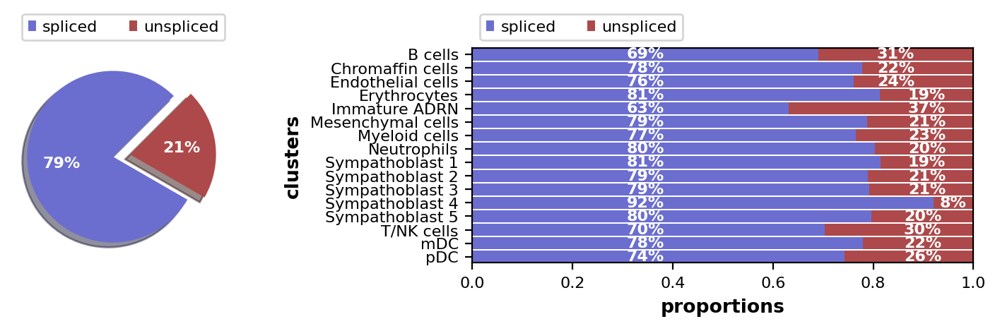

In [80]:
scv.pl.proportions(adata)

In [81]:
umap_df = pd.read_csv('/home/hsarkar/Projects/ThMYCN/tumor_umap.csv',index_col=0)

In [82]:
adata.obsm['X_umap'] = umap_df.loc[adata.obs.cell_id].values
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=8000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Filtered out 20751 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 8000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:22) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:21) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [83]:
scv.tl.recover_dynamics(adata, n_jobs=30)
scv.tl.velocity(adata, mode='dynamical', min_r2=0.005, min_likelihood=0.0001)
scv.tl.velocity_graph(adata, n_jobs=30)

recovering dynamics (using 30/56 cores)


  0%|          | 0/2471 [00:00<?, ?gene/s]

    finished (0:10:45) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:01:50) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 30/56 cores)


  0%|          | 0/41666 [00:00<?, ?cells/s]

    finished (0:01:15) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [ ]:
scv.pl.velocity_embedding_stream(dat,
                                 xlabel='', ylabel='',alpha=0.3,frameon=1,size=68,
                                 legend_loc=None,density=0.6,smooth=0.8, basis='umap',
                                 palette=["#00CCCCFF", "#66CC00FF" ,"#6600CCFF",'#CC0000FF'],
                                 title='Tumor',dpi = 120,save='tumor.comon.vel.pdf',
                                 figsize = [4.3,4])


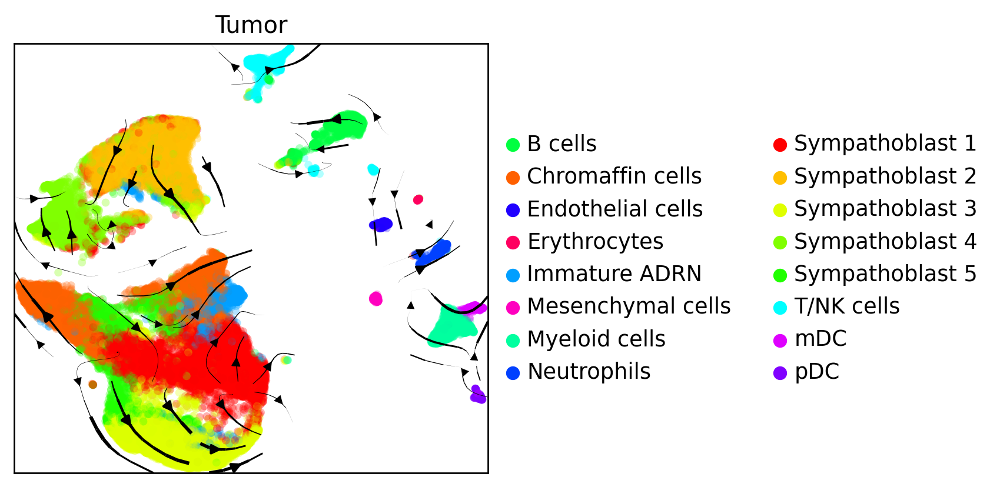

In [123]:
scv.pl.velocity_embedding_stream(adata,xlabel='', ylabel='',
                                 alpha=0.3,frameon=1,size=68,
                                 legend_loc='right_margin',
                                 density=0.6,smooth=0.8, basis='umap',
                                 palette=[code_dict[c] for c in adata.obs.clusters.cat.categories],
                                 title='Tumor',dpi = 120,figsize = [4.3,4])

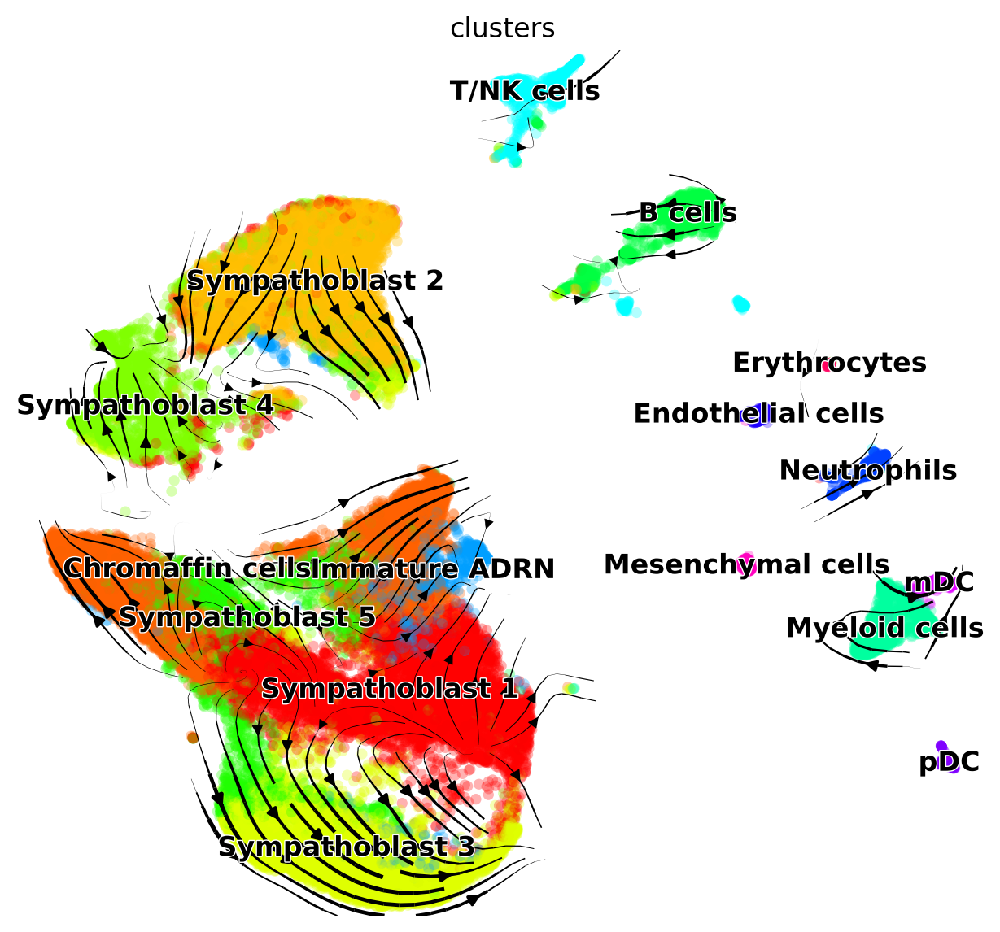

In [116]:
scv.pl.velocity_embedding_stream(adata, basis='umap',
                                 palette=[code_dict[c] for c in adata.obs.clusters.cat.categories],
                                 figsize = [7.3,7])

In [128]:
scv.tl.latent_time(adata)

computing latent time using root_cells as prior
    finished (0:00:23) --> added 
    'latent_time', shared time (adata.obs)


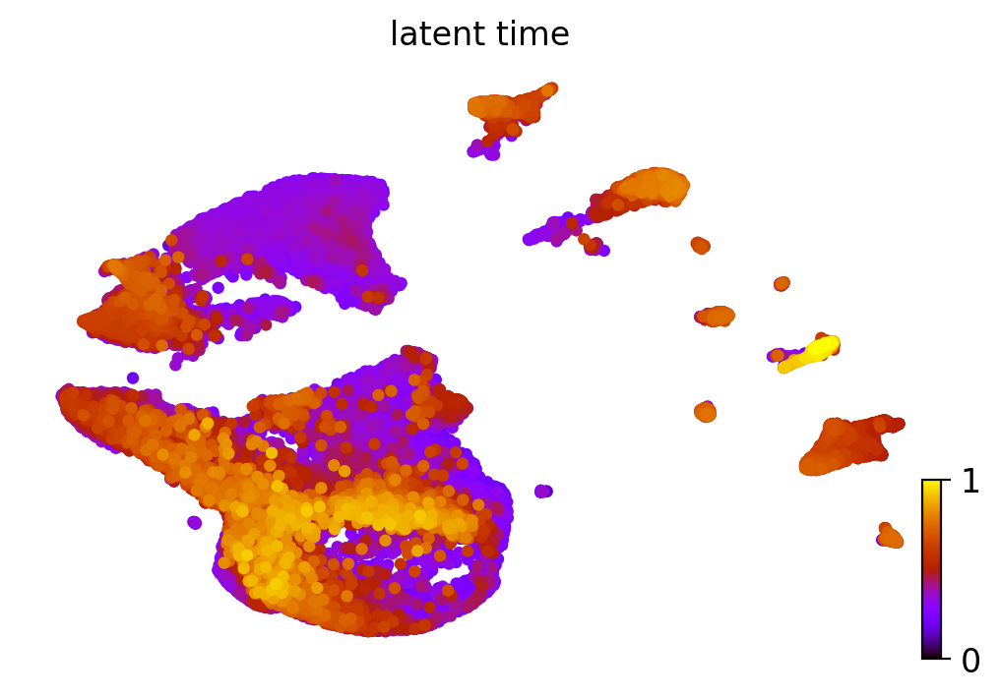

In [129]:
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80, colorbar=True)

## Subset of clusters

In [91]:
selected_cids = adata.obs.loc[adata.obs.clusters.isin([
    'Immature ADRN',
    'Sympathoblast 1',
    'Sympathoblast 2',
    'Sympathoblast 3',
    'Sympathoblast 4',
    'Sympathoblast 5',
    'Chromaffin cells'])].index

In [92]:
len(selected_cids)

35430

In [93]:
adata_subset = adata_raw[selected_cids, ]

In [94]:
adata_subset.obs.clusters = adata_subset.obs.clusters.astype("category")

Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


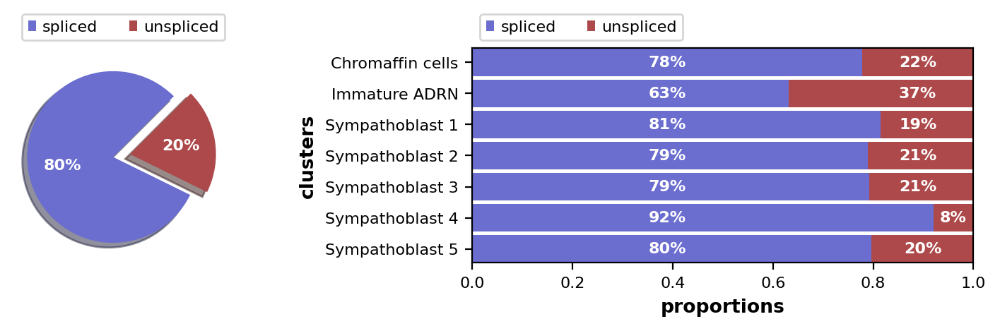

In [95]:
scv.pl.proportions(adata_subset)

In [96]:
adata_subset

AnnData object with n_obs × n_vars = 35430 × 31410
    obs: 'clusters', 'cell_id'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [97]:
umap_df = pd.read_csv('/home/hsarkar/Projects/ThMYCN/tumor_umap_subset.csv',index_col=0)

In [98]:
umap_df.shape

(35430, 2)

In [99]:
adata_subset.obsm['X_umap'] = umap_df.loc[adata_subset.obs.cell_id].values

In [100]:
adata_subset

AnnData object with n_obs × n_vars = 35430 × 31410
    obs: 'clusters', 'cell_id'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    obsm: 'X_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [101]:
scv.pp.filter_and_normalize(adata_subset, min_shared_counts=20, n_top_genes=8000)
scv.pp.moments(adata_subset, n_pcs=30, n_neighbors=30)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Filtered out 21751 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 8000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:06) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:21) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [102]:
scv.tl.recover_dynamics(adata_subset, n_jobs=30)
scv.tl.velocity(adata_subset, mode='dynamical', min_r2=0.005, min_likelihood=0.0001)
scv.tl.velocity_graph(adata_subset, n_jobs=30)

recovering dynamics (using 30/56 cores)


  0%|          | 0/507 [00:00<?, ?gene/s]

    finished (0:03:37) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:19) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 30/56 cores)


  0%|          | 0/35430 [00:00<?, ?cells/s]

    finished (0:00:38) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [111]:
[code_dict[c] for c in adata_subset.obs.clusters.cat.categories]

['#FF6000', '#009FFF', '#FF0000', '#FFBF00', '#DFFF00', '#80FF00', '#20FF00']

In [109]:
adata_subset.obs.clusters.cat.categories

Index(['Chromaffin cells', 'Immature ADRN', 'Sympathoblast 1',
       'Sympathoblast 2', 'Sympathoblast 3', 'Sympathoblast 4',
       'Sympathoblast 5'],
      dtype='object')

computing velocity embedding
    finished (0:00:12) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


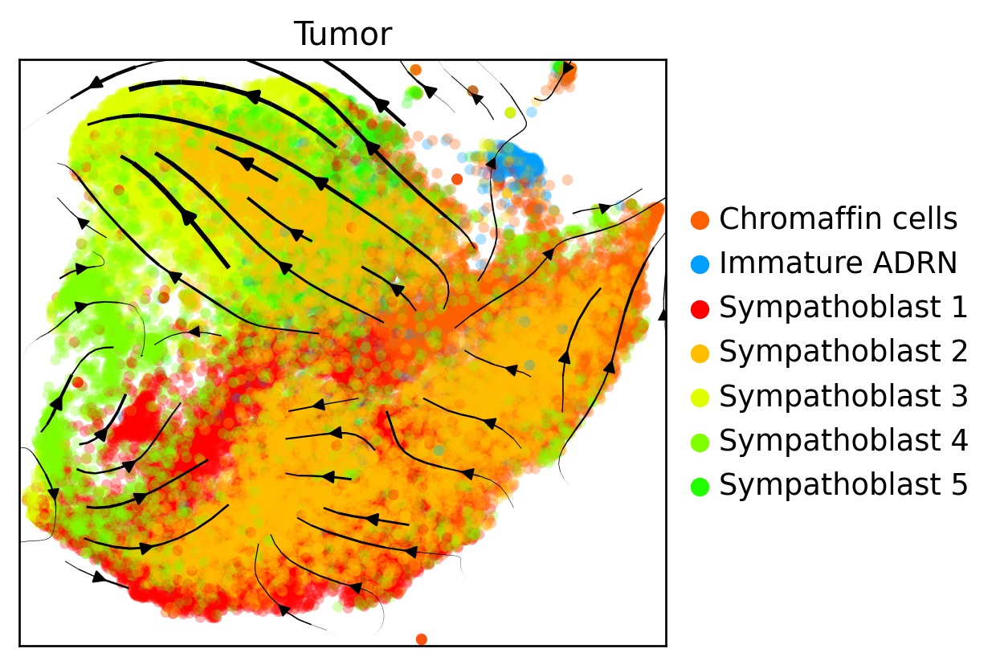

In [112]:
scv.pl.velocity_embedding_stream(adata_subset,xlabel='', 
                                 ylabel='',alpha=0.3,
                                 frameon=1,size=68,
                                 palette=[code_dict[c] for c in adata_subset.obs.clusters.cat.categories],
                                 legend_loc='right_margin',
                                 density=0.6,smooth=0.8, basis='umap',
                                 title='Tumor',dpi = 120,figsize = [4.3,4])

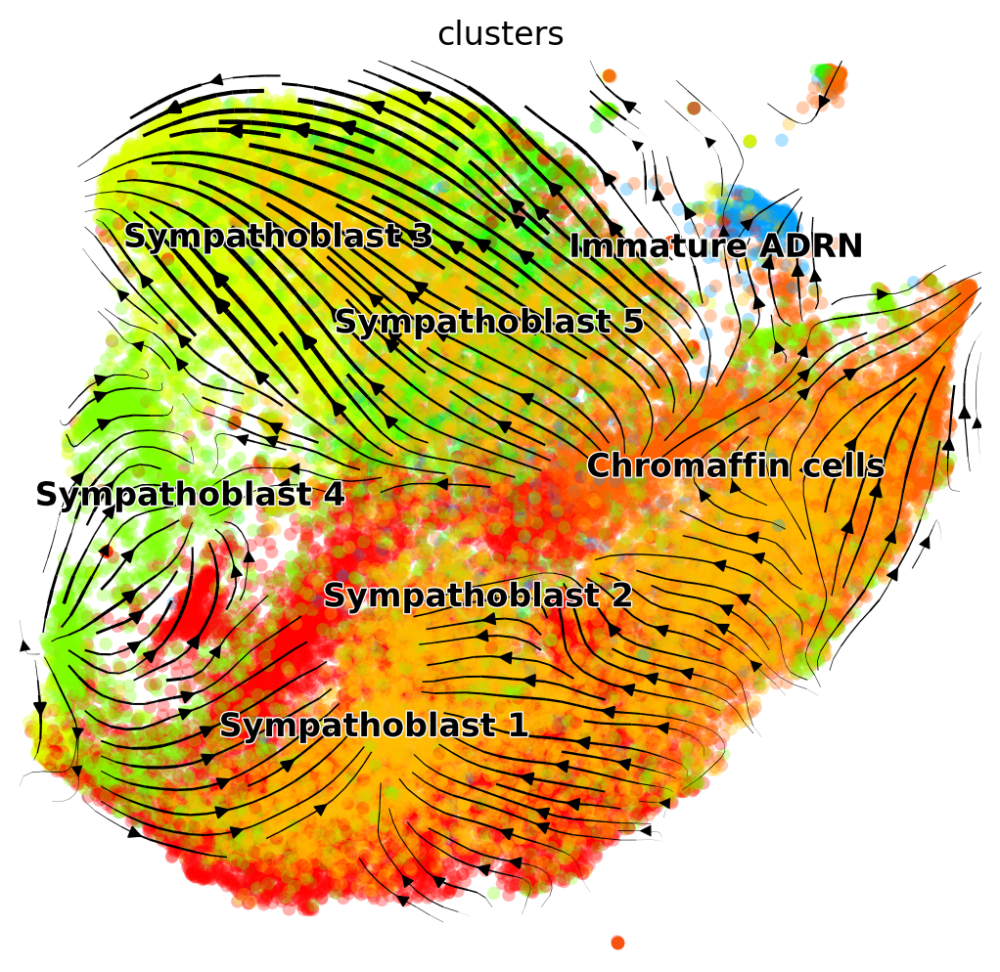

In [113]:
scv.pl.velocity_embedding_stream(adata_subset,
                                 palette=[code_dict[c] for c in adata_subset.obs.clusters.cat.categories] ,
                                 basis='umap',
                                 figsize = [6.3,6])

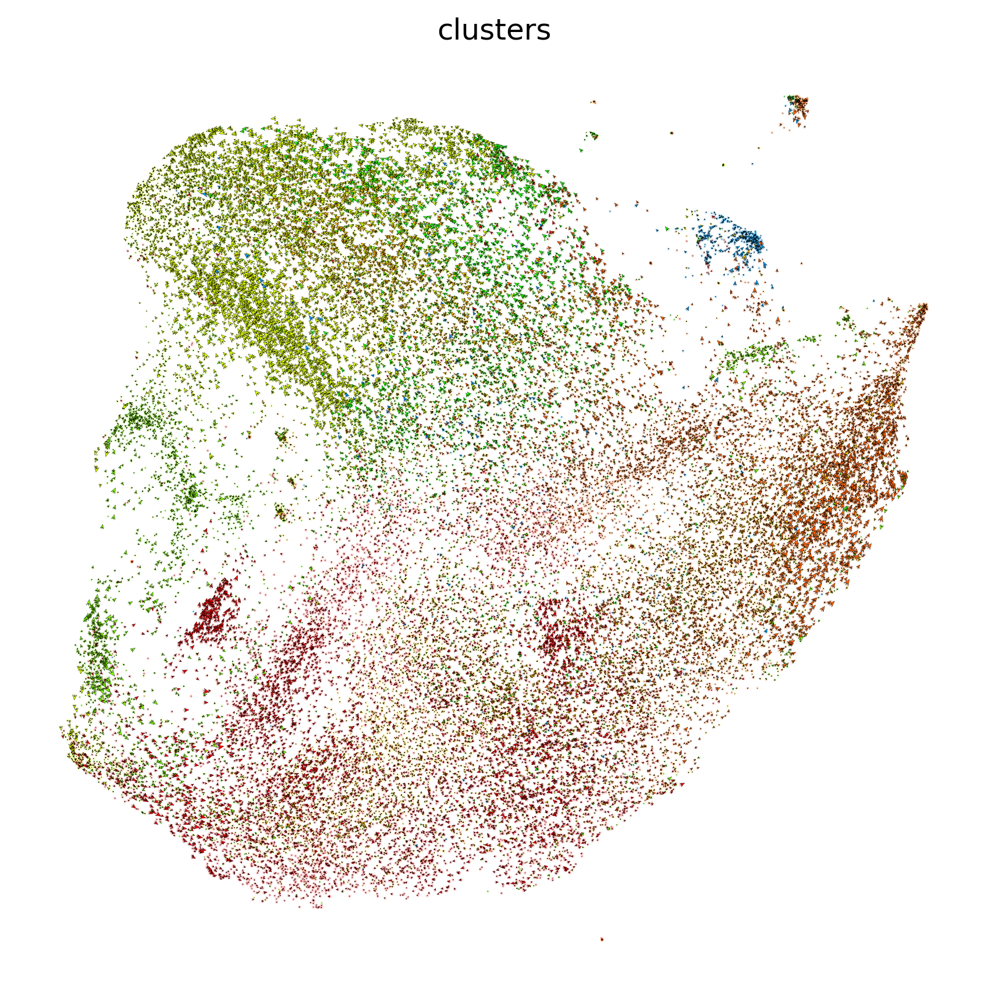

In [121]:
scv.pl.velocity_embedding(adata_subset, arrow_length=4, 
                          palette=[code_dict[c] for c in adata_subset.obs.clusters.cat.categories],
                          arrow_size=4, dpi=150,
                          #legend_loc='on data',
                          figsize = [7,7])

In [124]:
gene_anot

,gene,cluster.name
1,MYCN,All Sympathoblasts
2,Phox2b,All Sympathoblasts
3,Isl1,All Sympathoblasts
4,Stmn1,All Sympathoblasts
5,Cdc20,Sympathoblast 1
...,...,...
89,Siglech,pDC
90,Hba-a2,Erythrocytes
91,Hbb-bs,Erythrocytes
92,Hba-a1,Erythrocytes


In [125]:
scv.tl.latent_time(adata_subset)

computing terminal states
    identified 5 regions of root cells and 1 region of end points .
    finished (0:00:08) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:14) --> added 
    'latent_time', shared time (adata.obs)


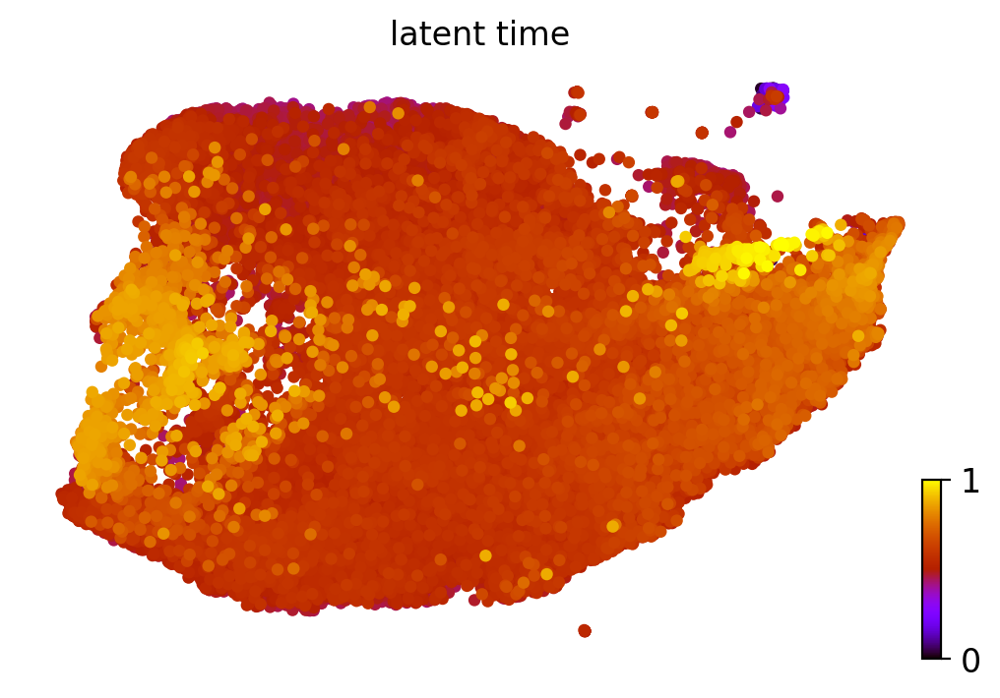

In [127]:
scv.pl.scatter(adata_subset, color='latent_time', color_map='gnuplot', size=80, colorbar=True)

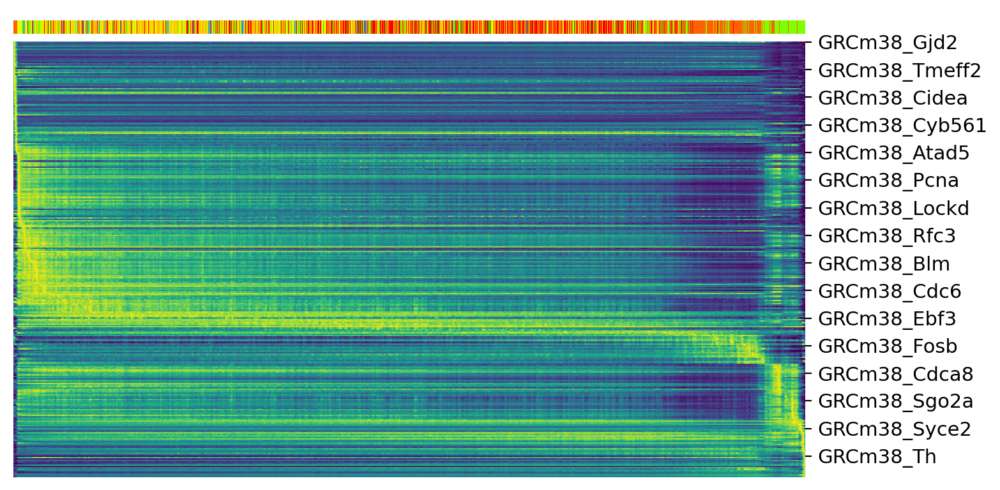

In [140]:
top_genes = adata_subset.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata_subset, var_names=top_genes, tkey='latent_time', n_convolve=100, col_color='clusters')

In [173]:
mod_gene = ['mycn___MYCN'] +  list('GRCm38_' + gene_anot.gene.values[1:])

In [183]:
mod_gene[:10]

['mycn___MYCN',
 'GRCm38_Phox2b',
 'GRCm38_Isl1',
 'GRCm38_Stmn1',
 'GRCm38_Cdc20',
 'GRCm38_Pttg1',
 'GRCm38_Ccnb2',
 'GRCm38_Cenpa',
 'GRCm38_Ube2c',
 'GRCm38_Nefl']

In [184]:
gene_anot['mod_gene'] = mod_gene

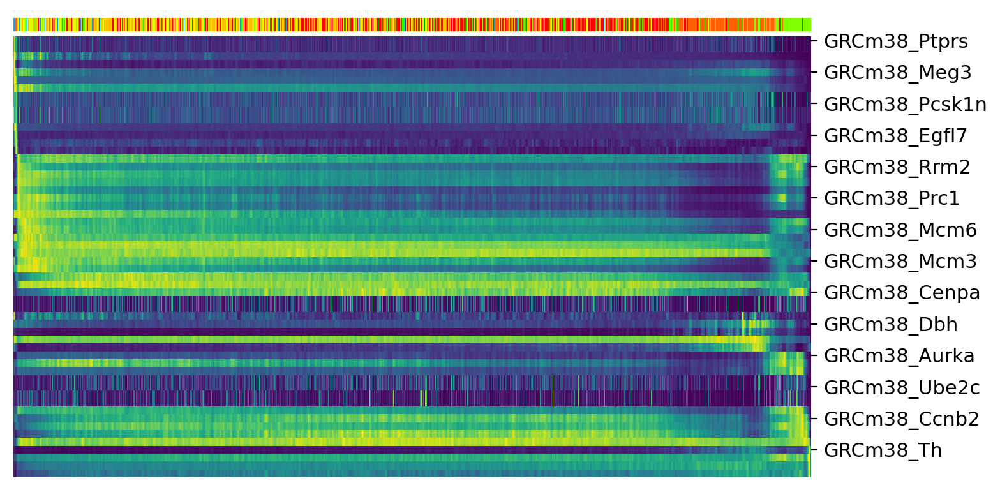

In [176]:
top_genes = adata_subset.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata_subset, var_names=mod_gene, tkey='latent_time', n_convolve=100, col_color='clusters')

In [199]:
gene_anot_dict = gene_anot[['mod_gene','cluster.name']].groupby(['cluster.name'])['mod_gene'].apply(list).to_dict()

In [197]:
gene_anot.head()

,gene,cluster.name,mod_gene
1,MYCN,All Sympathoblasts,mycn___MYCN
2,Phox2b,All Sympathoblasts,GRCm38_Phox2b
3,Isl1,All Sympathoblasts,GRCm38_Isl1
4,Stmn1,All Sympathoblasts,GRCm38_Stmn1
5,Cdc20,Sympathoblast 1,GRCm38_Cdc20


## Interprete the velocities

In [200]:
gene_anot_dict 

{'All Sympathoblasts': ['mycn___MYCN',
  'GRCm38_Phox2b',
  'GRCm38_Isl1',
  'GRCm38_Stmn1'],
 'B cells': ['GRCm38_Igkc',
  'GRCm38_Ighd',
  'GRCm38_Bank1',
  'GRCm38_Ms4a1',
  'GRCm38_Cd79a',
  'GRCm38_Cd79b',
  'GRCm38_Mzb1'],
 'Chromaffin cells': ['GRCm38_Th',
  'GRCm38_Dbh',
  'GRCm38_Npy',
  'GRCm38_Caly',
  'GRCm38_Chga',
  'GRCm38_Pcsk1n',
  'GRCm38_Podxl2',
  'GRCm38_Ptprs'],
 'Endothelial cells': ['GRCm38_Cdh5',
  'GRCm38_Egfl7',
  'GRCm38_Emcn',
  'GRCm38_Cd34',
  'GRCm38_Kdr'],
 'Erythrocytes': ['GRCm38_Hba-a2',
  'GRCm38_Hbb-bs',
  'GRCm38_Hba-a1',
  'GRCm38_Hbb-bt'],
 'Immature ADRN': ['GRCm38_Sox11',
  'GRCm38_Tcf4',
  'GRCm38_Eml5',
  'GRCm38_Ttc3',
  'GRCm38_Meg3',
  'GRCm38_Peg10',
  'GRCm38_Atrx',
  'GRCm38_Xist',
  'GRCm38_Gm26917',
  'GRCm38_Gm42418',
  'GRCm38_Kcnq1ot1',
  'GRCm38_Ptprs',
  'GRCm38_Ncam1',
  'GRCm38_Podxl2',
  'GRCm38_Pcsk1n',
  'GRCm38_Elavl3',
  'GRCm38_MYCN'],
 'Mesenchymal cells': ['GRCm38_Mgp',
  'GRCm38_Prrx1',
  'GRCm38_Pdgfrb',
  'GRCm38_Dc

In [201]:
gene_anot_dict['B cells']

['GRCm38_Igkc',
 'GRCm38_Ighd',
 'GRCm38_Bank1',
 'GRCm38_Ms4a1',
 'GRCm38_Cd79a',
 'GRCm38_Cd79b',
 'GRCm38_Mzb1']

### Identify important genes

In [114]:
scv.tl.rank_velocity_genes(adata_subset, groupby='clusters', min_corr=.3)

df = scv.DataFrame(adata_subset.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:01:03) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,Chromaffin cells,Immature ADRN,Sympathoblast 1,Sympathoblast 2,Sympathoblast 3,Sympathoblast 4,Sympathoblast 5
0,GRCm38_Usp1,GRCm38_Cenph,GRCm38_Zfpm1,GRCm38_Basp1,GRCm38_Ncapg,GRCm38_Actb,GRCm38_Ttk
1,GRCm38_Smc2,GRCm38_March11,GRCm38_Wee1,GRCm38_Rec114,GRCm38_Cep55,GRCm38_Zcchc12,GRCm38_Cenph
2,GRCm38_Dnmt1,GRCm38_Cotl1,GRCm38_Pak3,GRCm38_Csrp2,GRCm38_Kif15,GRCm38_Chgb,GRCm38_Ncapg
3,GRCm38_Plk4,GRCm38_Hsd17b12,GRCm38_Uhrf1,GRCm38_Atf3,GRCm38_Parpbp,GRCm38_Mcm3,GRCm38_Shcbp1
4,GRCm38_Cdc45,GRCm38_Nasp,GRCm38_Gfra3,GRCm38_Nnat,GRCm38_Ttk,GRCm38_3830403N18Rik,GRCm38_Parpbp


In [219]:
var_names = gene_anot_dict['Chromaffin cells'][:4]
scv.tl.differential_kinetic_test(adata_subset, var_names=var_names, groupby='clusters')


testing for differential kinetics
    finished (0:00:04) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)

outputs model fit of gene: GRCm38_Caly


In [220]:
scv.get_df(adata_subset[:, var_names], ['fit_diff_kinetics', 'fit_pval_kinetics'], precision=2)

,fit_diff_kinetics,fit_pval_kinetics
Gene,,
GRCm38_Th,Sympathoblast 4,1.23e-06
GRCm38_Npy,Chromaffin cells,1.70e-04
GRCm38_Caly,Sympathoblast 4,5.07e-240


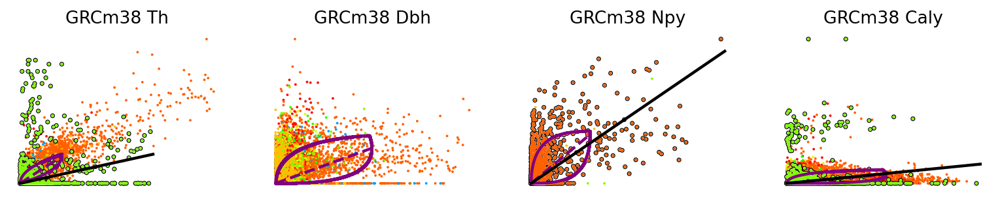

In [221]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
scv.pl.scatter(adata_subset, basis=var_names, add_outline='fit_diff_kinetics', **kwargs)

In [216]:
gene_anot_dict['Chromaffin cells'][:4]

['GRCm38_Th', 'GRCm38_Dbh', 'GRCm38_Npy', 'GRCm38_Caly']

In [210]:
df['Chromaffin cells'][:2]

0    GRCm38_Usp1
1    GRCm38_Smc2
Name: Chromaffin cells, dtype: object

In [212]:
pd.Series(gene_anot_dict['B cells'])

0     GRCm38_Igkc
1     GRCm38_Ighd
2    GRCm38_Bank1
3    GRCm38_Ms4a1
4    GRCm38_Cd79a
5    GRCm38_Cd79b
6     GRCm38_Mzb1
dtype: object

## Speed and coherence
Two more useful stats:

- The speed or rate of differentiation is given by the length of the velocity vector.
- The coherence of the vector field (i.e., how a velocity vector correlates with its neighboring velocities) provides a measure of confidence.

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


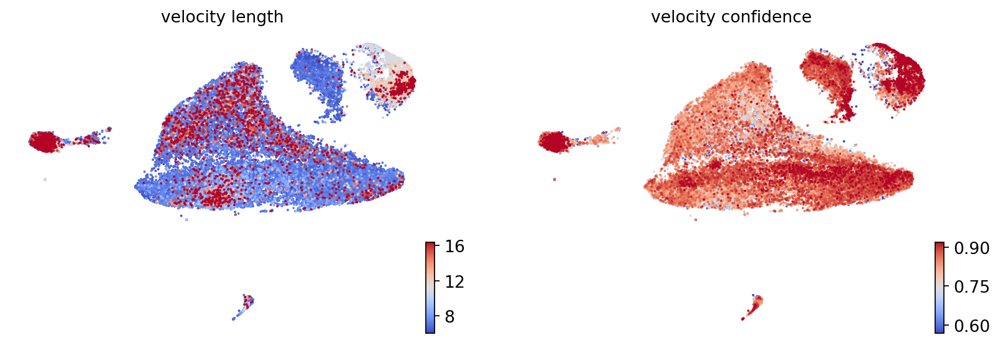

In [242]:
scv.tl.velocity_confidence(adata_subset)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_subset, c=keys, cmap='coolwarm', perc=[5, 95])

In [244]:
df = adata_subset.obs.groupby('clusters')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)


clusters,1,2,3,4,5,6,10
velocity_length,7.448950,8.520779,7.138729,10.387630,7.110918,11.151161,7.456112
velocity_confidence,0.804788,0.740916,0.836947,0.798889,0.838582,0.790704,0.775479


## Velocity graph and pseudotime

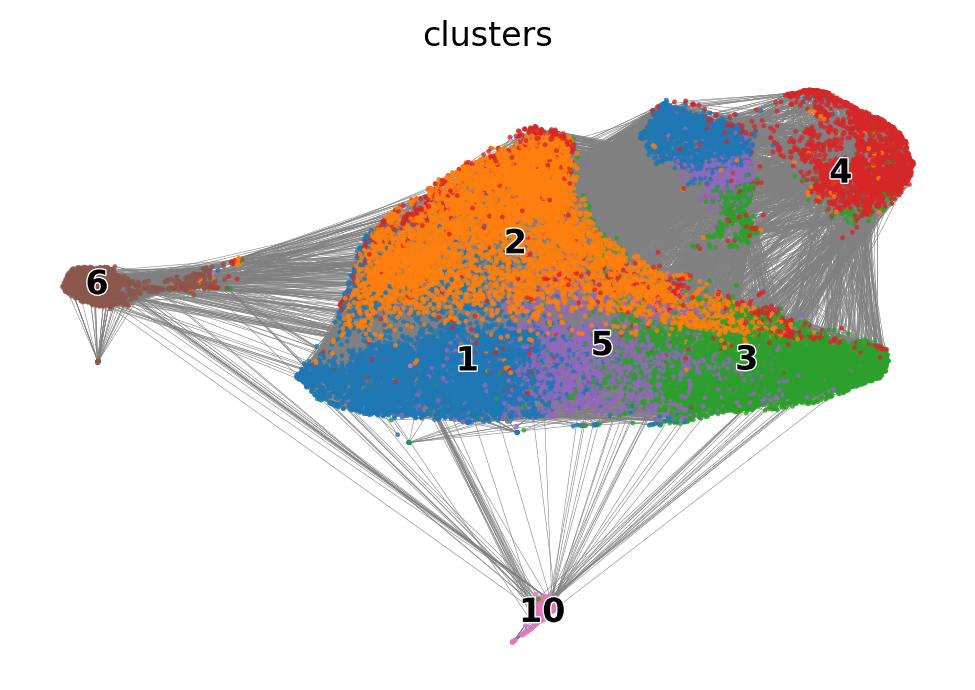

In [246]:
scv.pl.velocity_graph(adata_subset, threshold=.1)

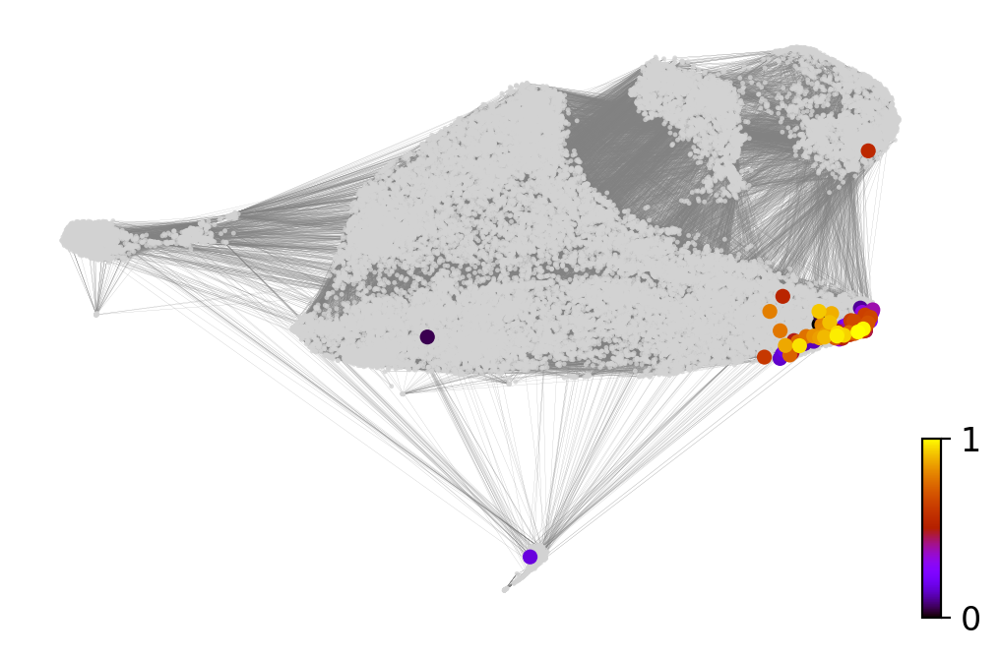

In [247]:
x, y = scv.utils.get_cell_transitions(adata_subset, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata_subset, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata_subset, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

computing terminal states
    identified 4 regions of root cells and 4 regions of end points .
    finished (0:00:05) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


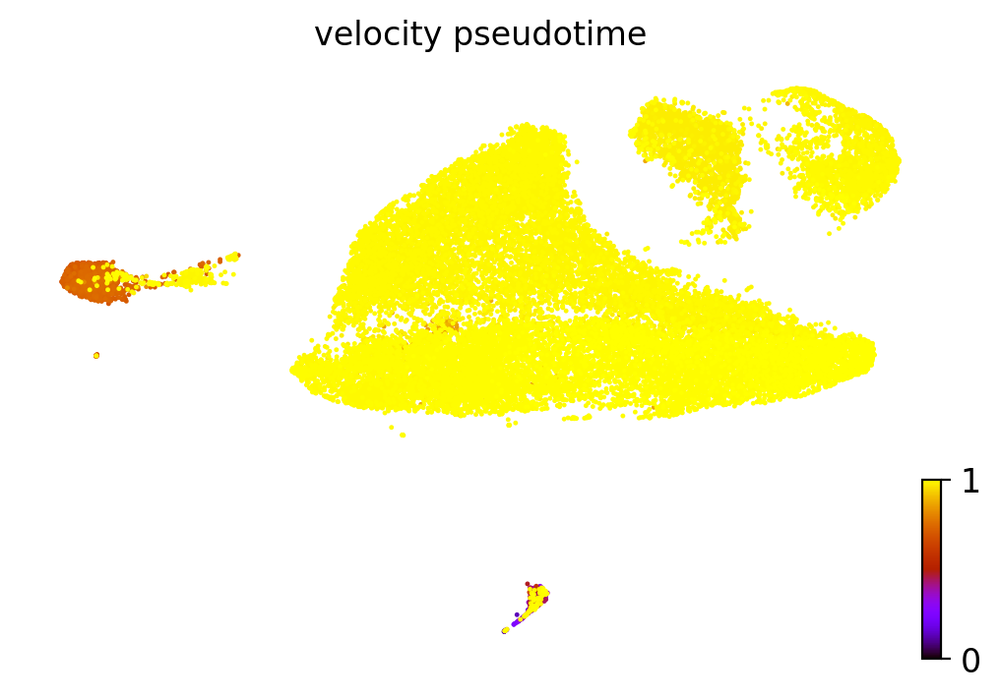

In [248]:
scv.tl.velocity_pseudotime(adata_subset)
scv.pl.scatter(adata_subset, color='velocity_pseudotime', cmap='gnuplot')

## PAGA velocity graph
PAGA graph abstraction has benchmarked as top-performing method for trajectory inference. It provides a graph-like map of the data topology with weighted edges corresponding to the connectivity between two clusters. Here, PAGA is extended by velocity-inferred directionality.

In [249]:
# PAGA requires to install igraph, if not done yet.
!pip install python-igraph --upgrade --quiet

In [223]:
# this is needed due to a current bug - bugfix is coming soon.
adata_subset.uns['neighbors']['distances'] = adata_subset.obsp['distances']
adata_subset.uns['neighbors']['connectivities'] = adata_subset.obsp['connectivities']

scv.tl.paga(adata_subset, groups='clusters')
df = scv.get_df(adata_subset, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:11) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,Chromaffin cells,Immature ADRN,Sympathoblast 1,Sympathoblast 2,Sympathoblast 3,Sympathoblast 4,Sympathoblast 5
Chromaffin cells,0,0.13,0.34,0,0,0,0.4
Immature ADRN,0,0,0,0,0,0,0
Sympathoblast 1,0,0,0,0,0,0,0
Sympathoblast 2,0,0,0,0,0,0,0
Sympathoblast 3,0,0,0,0,0,0,0
Sympathoblast 4,0.041,0,0,0.12,0,0,0
Sympathoblast 5,0,0,0,0,0.77,0,0


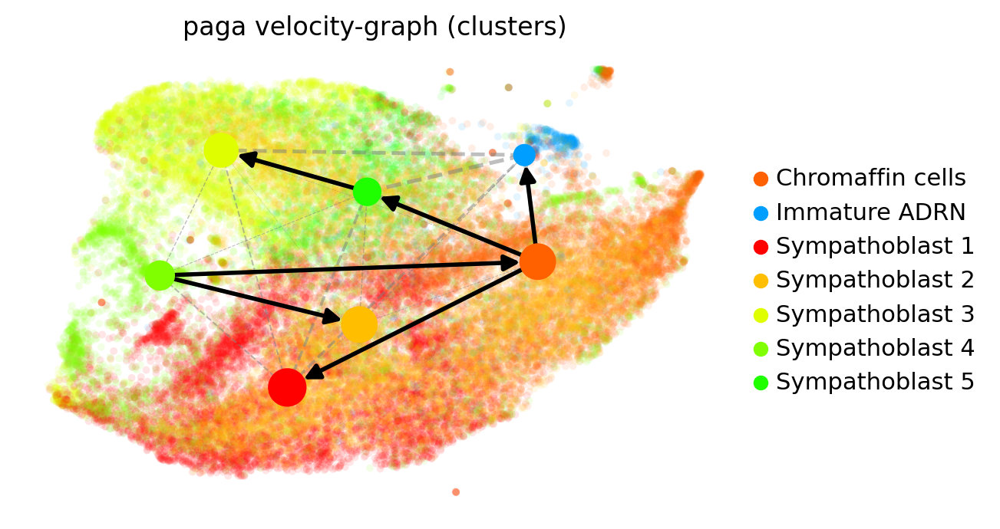

In [225]:
scv.pl.paga(adata_subset, basis='umap', 
            palette=[code_dict[c] for c in adata_subset.obs.clusters.cat.categories],
            size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

In [227]:
set([code_dict[c] for c in adata_subset.obs.clusters.cat.categories])

{'#009FFF', '#20FF00', '#80FF00', '#DFFF00', '#FF0000', '#FF6000', '#FFBF00'}